In [1]:
# log in to the kaggle website

from google.colab import files
import os
#if you've already uploaded kaggle.json before, don't do it again
if not(os.path.exists("kaggle.json")):
  files.upload() #upload kaggle.json
!pip install --upgrade --force-reinstall --no-deps kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 58 kB 5.7 MB/s 
  Created wheel for kaggle: filename=kaggle-1.5.12-py3-none-any.whl size=73051 sha256=bcda62cbf3122e2edc6374453eb43700715a26a5d9879aec050f81947c30be3c
  Stored in directory: /root/.cache/pip/wheels/62/d6/58/5853130f941e75b2177d281eb7e44b4a98ed46dd155f556dc5
Successfully built kaggle
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.5.12
    Uninstalling kaggle-1.5.12:
      Successfully uninstalled kaggle-1.5.12
kaggle.json


# Louding data

In [ ]:
# Download and unzip Oxford-IIIT Pet Dataset

!kaggle datasets download -d tanlikesmath/the-oxfordiiit-pet-dataset
!unzip the-oxfordiiit-pet-dataset.zip

In [3]:
# Libraries

import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.preprocessing import image_dataset_from_directory
from keras.preprocessing import image
import glob


In [4]:
# for better understanding labeling process and data structure

dir_name='/content/images/*'

pets_files = glob.glob(dir_name) 
pets_df = pd.DataFrame(pets_files)
pets_df.columns =['full_path']
pets_df['file_name'] = pets_df['full_path'].str.split('images/').str[1]

# labels in this dataset are in the file name
pets_df['label'] = pets_df['file_name'].str.rsplit('_',1).str[0]
classNames = pets_df.label.unique()
pets_df.tail()



,full_path,file_name,label
7389,/content/images/basset_hound_198.jpg,basset_hound_198.jpg,basset_hound
7390,/content/images/english_setter_36.jpg,english_setter_36.jpg,english_setter
7391,/content/images/german_shorthaired_42.jpg,german_shorthaired_42.jpg,german_shorthaired
7392,/content/images/pug_170.jpg,pug_170.jpg,pug
7393,/content/images/Russian_Blue_136.jpg,Russian_Blue_136.jpg,Russian_Blue


In [5]:
# train and test gneration


datagen = image.ImageDataGenerator(rescale=1/255., validation_split=0.2)
train_generator = datagen.flow_from_dataframe(dataframe=pets_df, 
                                              directory= '/content/images/images',
                                              x_col='file_name',
                                              y_col='label',
                                              target_size=(224,224),
                                              class_mode='categorical',
                                              batch_size=100,
                                              subset='training'
                                             )

validation_generator = datagen.flow_from_dataframe(dataframe=pets_df,
                                                   directory= '/content/images/images',
                                                   x_col='file_name',                                                   
                                                   y_col='label',
                                                   target_size=(224,224),
                                                   class_mode='categorical',
                                                   batch_size=10,
                                                  subset='validation',
                                                  seed=7
                                                   )

Found 5912 validated image filenames belonging to 37 classes.
Found 1477 validated image filenames belonging to 37 classes.


/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/dataframe_iterator.py:282: UserWarning: Found 5 invalid image filename(s) in x_col="file_name". These filename(s) will be ignored.
  .format(n_invalid, x_col)


{'pomeranian'}


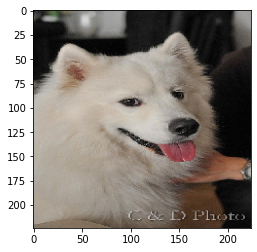

{'american_bulldog'}


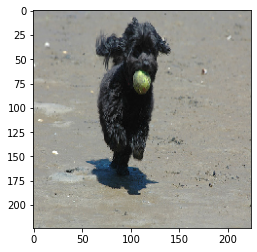

{'english_cocker_spaniel'}


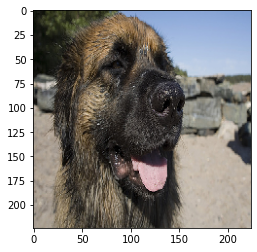

In [6]:
# randomly plot from trainset
from matplotlib import pyplot as plt
xtbatches , ytbatches = next(train_generator)
for i in range (0,3):
    image1 = xtbatches[i]
    print({classNames[ytbatches[i].argmax()]})
    plt.imshow(image1)
    plt.show()


# Model

In [7]:
# TensorBoard notebook
# Clear any logs from previous runs
import tensorflow as tf
import datetime, os

%rm -rf ./logs/

### The VGG 19 model was inspired from:
https://github.com/keras-team/keras/blob/v2.10.0/keras/applications/vgg19.py#L48-L260

###  I have used the transform learning and freezing technique for Conv layers in VGG 19 model. However, it is better to retrain latter layers to model be more comfortable with the new dataset. Initial layers in the model mostly extract features like horizontal and vertical lines; in contrast, latter layers focus on pattern recognition. Transform learning technique, first, the model is learned and then the weight of each layer is transferred to the new application. 

Note: because of memory shortage, units of fully connected layers reduced to 1024 units instead of 4096.

In [16]:
from keras.models import Sequential 
import keras
from keras import optimizers, models, layers
from keras.layers import Dropout, Flatten, Dense, Conv2D, MaxPooling2D
import tensorflow as tf
from keras.utils import data_utils


tf.keras.backend.clear_session()



data = tf.keras.Input(shape=(224,224,3)) # input shape

# Block 1
x = layers.Conv2D(64, (3, 3), activation="relu", padding="same", name="block1_conv1", trainable=False)(data)
x = layers.Conv2D(64, (3, 3), activation="relu", padding="same", name="block1_conv2", trainable=False)(x)
x = Dropout(0.2)(x)
x = layers.MaxPooling2D((2, 2), strides=(2, 2), name="block1_pool", trainable=False)(x)

# Block 2
x = layers.Conv2D(128, (3, 3), activation="relu", padding="same", name="block2_conv1", trainable=False)(x)
x = layers.Conv2D(128, (3, 3), activation="relu", padding="same", name="block2_conv2", trainable=False)(x)
x = Dropout(0.2)(x)
x = layers.MaxPooling2D((2, 2), strides=(2, 2), name="block2_pool", trainable=False)(x)

# Block 3
x = layers.Conv2D(256, (3, 3), activation="relu", padding="same", name="block3_conv1")(x)
x = layers.Conv2D(256, (3, 3), activation="relu", padding="same", name="block3_conv2")(x)
x = layers.Conv2D(256, (3, 3), activation="relu", padding="same", name="block3_conv3")(x)
x = layers.Conv2D(256, (3, 3), activation="relu", padding="same", name="block3_conv4")(x)
x = Dropout(0.2)(x)
x = layers.MaxPooling2D((2, 2), strides=(2, 2), name="block3_pool")(x)

# Block 4
x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block4_conv1")(x)
x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block4_conv2")(x)
x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block4_conv3")(x)
x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block4_conv4")(x)
x = Dropout(0.2)(x)
x = layers.MaxPooling2D((2, 2), strides=(2, 2), name="block4_pool")(x)

# Block 5
x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block5_conv1")(x)
x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block5_conv2")(x)
x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block5_conv3")(x)
x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block5_conv4")(x)
x = Dropout(0.2)(x)
x = layers.MaxPooling2D((2, 2), strides=(2, 2), name="block5_pool")(x)


x = layers.Flatten(name="flatten")(x)
x = layers.Dense(1024, activation="relu", name="fc_1")(x)
x = Dropout(0.2)(x)
x = layers.Dense(1024, activation="relu", name="fc_2")(x)
x = Dropout(0.2)(x)

out = x = layers.Dense(37, activation="softmax", name="prediction")(x) # Output layer for classification

model = tf.keras.Model(data, out) # build model 

#Loud weights
WEIGHTS_PATH = (
    "https://storage.googleapis.com/tensorflow/keras-applications/"
    "vgg19/vgg19_weights_tf_dim_ordering_tf_kernels.h5"
)
weights_path = data_utils.get_file(
                "vgg19_weights_tf_dim_ordering_tf_kernels.h5",
                WEIGHTS_PATH,
                cache_subdir="models",
                file_hash="cbe5617147190e668d6c5d5026f83318",
            )
model.load_weights(weights_path, by_name=True)


#optimizer # Adam was tested but it wasn't good as SGD
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-2,
    decay_steps=10000,
    decay_rate=0.9)
optimizer = tf.keras.optimizers.SGD(learning_rate=lr_schedule)
model.compile(loss = 'categorical_crossentropy', optimizer = optimizer, metrics = ['accuracy']) # config model

model.summary()

# for monitoring with TensorBoard notebook
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

# run model
history = model.fit(
    train_generator,
    validation_data= validation_generator,
    epochs=15,
    callbacks=[tensorboard_callback]
)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 dropout (Dropout)           (None, 224, 224, 64)      0         
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584

# **Findings**

### In the first step, I had not utilized Dropout. I have frozen all layers, excluding FC layers. Following reports accuracy and loss of model. Therefore model couldn't reach to acceptablr accuracy.

Epoch 1/10

60/60 [==============================] - 62s 1s/step - loss: 3.5396 - accuracy: 0.0607 - val_loss: 3.3432 - val_accuracy: 0.0833

Epoch 2/10

60/60 [==============================] - 58s 968ms/step - loss: 3.2341 - accuracy: 0.1269 - val_loss: 2.9973 - val_accuracy: 0.2024

Epoch 29/30

60/60 [==============================] - 62s 1s/step - loss: 1.1529 - accuracy: 0.6576 - val_loss: 1.7439 - val_accuracy: 0.4800

Epoch 30/30

60/60 [==============================] - 58s 961ms/step - loss: 1.1103 - accuracy: 0.6717 - val_loss: 1.6312 - val_accuracy: 0.4895

### I added some Dropout layers to ameliorate overfitting. Furthermore, decreased frozen layers allow the model to modify its weights based on the dataset.  Finally, accuracy reached 81 percent.

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


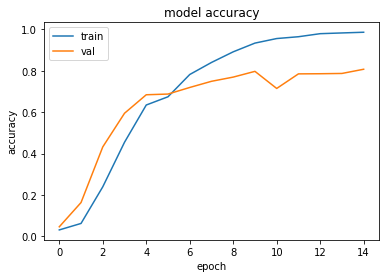

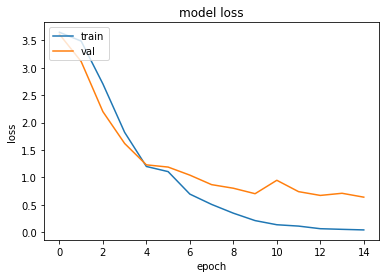

In [17]:
print(history.history.keys())
# summarize history for accuracy
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
# summarize history for loss
plt.figure()
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


In [18]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
logs_base_dir = "./logs"
os.makedirs(logs_base_dir, exist_ok=True)
%tensorboard --logdir {logs_base_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

# Evaluation
### It's time to see how the model can predict unseen data. Therefore, the following section compares the actual label of each image with the predicted label.

Predicted Class: miniature_pinscher
Correct Class : miniature_pinscher


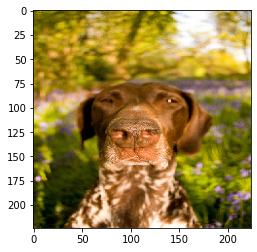

Predicted Class: Russian_Blue
Correct Class : Russian_Blue


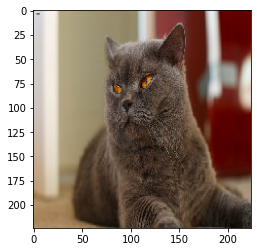

Predicted Class: boxer
Correct Class : boxer


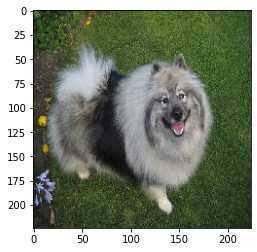

Predicted Class: chihuahua
Correct Class : chihuahua


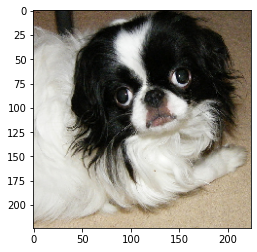

Predicted Class: english_setter
Correct Class : english_setter


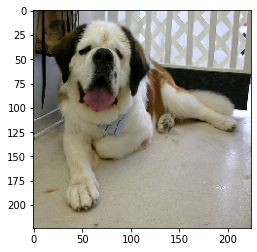

Predicted Class: english_cocker_spaniel
Correct Class : chihuahua


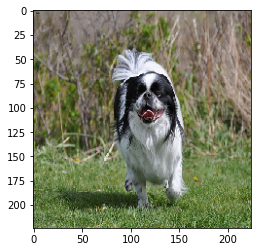

Predicted Class: Abyssinian
Correct Class : english_setter


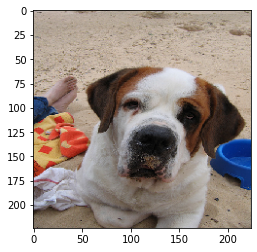

Predicted Class: american_bulldog
Correct Class : american_bulldog


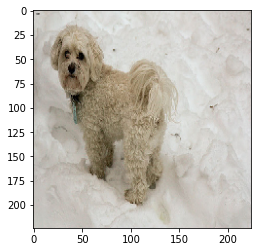

Predicted Class: great_pyrenees
Correct Class : great_pyrenees


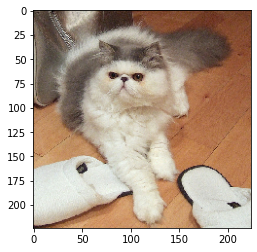

Predicted Class: Sphynx
Correct Class : yorkshire_terrier


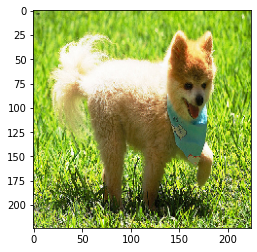

In [19]:
# The model performace chaching

X_test, y_test = next(validation_generator)
y_proba = model.predict(X_test)
for i in range(len(y_proba)):
    classFinal = y_proba[i].argmax()
    print(f'Predicted Class: {classNames[classFinal]}')
    print(f'Correct Class : {classNames[y_test[i].argmax()]}')
    plt.imshow(X_test[i])
    plt.show()
  #  break

In [20]:
# Store the data in X_train, y_train variables by iterating over the batches

import numpy
validation_generator.reset()
X_test,y_test = next(validation_generator)
for i in range(0,(numpy.math.ceil(validation_generator.samples / validation_generator.batch_size)-1)): 
  img, label = next(validation_generator)
  X_test = np.append(X_test, img, axis=0 )
  y_test = np.append(y_test, label, axis=0)
print(X_test.shape, y_test.shape)



(1477, 224, 224, 3) (1477, 37)


In [21]:
# Calculate (Precision,Recall,F1-score) for each category 

from sklearn.metrics import confusion_matrix,classification_report
import numpy

test_steps_per_epoch = numpy.math.ceil(validation_generator.samples / validation_generator.batch_size)

#predictions = model.predict_generator(validation_generator, steps=test_steps_per_epoch)
predictions = model.predict(X_test)
# Get most likely class
predicted_classes = numpy.argmax(predictions, axis=1)

true_classes = numpy.argmax(y_test, axis=1)
class_labels = list(validation_generator.class_indices.keys())   

report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report) 

                            precision    recall  f1-score   support

                Abyssinian       0.64      0.95      0.77        40
                    Bengal       0.79      0.69      0.74        39
                    Birman       0.79      0.73      0.76        41
                    Bombay       0.82      1.00      0.90        41
         British_Shorthair       0.86      0.76      0.81        50
              Egyptian_Mau       0.88      0.83      0.85        35
                Maine_Coon       0.85      0.80      0.82        35
                   Persian       0.93      0.75      0.83        36
                   Ragdoll       0.68      0.78      0.72        32
              Russian_Blue       0.72      0.83      0.77        41
                   Siamese       0.82      0.75      0.78        36
                    Sphynx       0.98      0.91      0.95        47
          american_bulldog       0.71      0.64      0.67        42
 american_pit_bull_terrier       0.51      0.55

### From the previous table and confusion matrix (in the next section), It can be understood that model is struggling with predicting animals with similar features. For example, american_pit_bull_terrier and staffordshire_bull_terrier have many familiar elements that toughen decision-making even for humans.

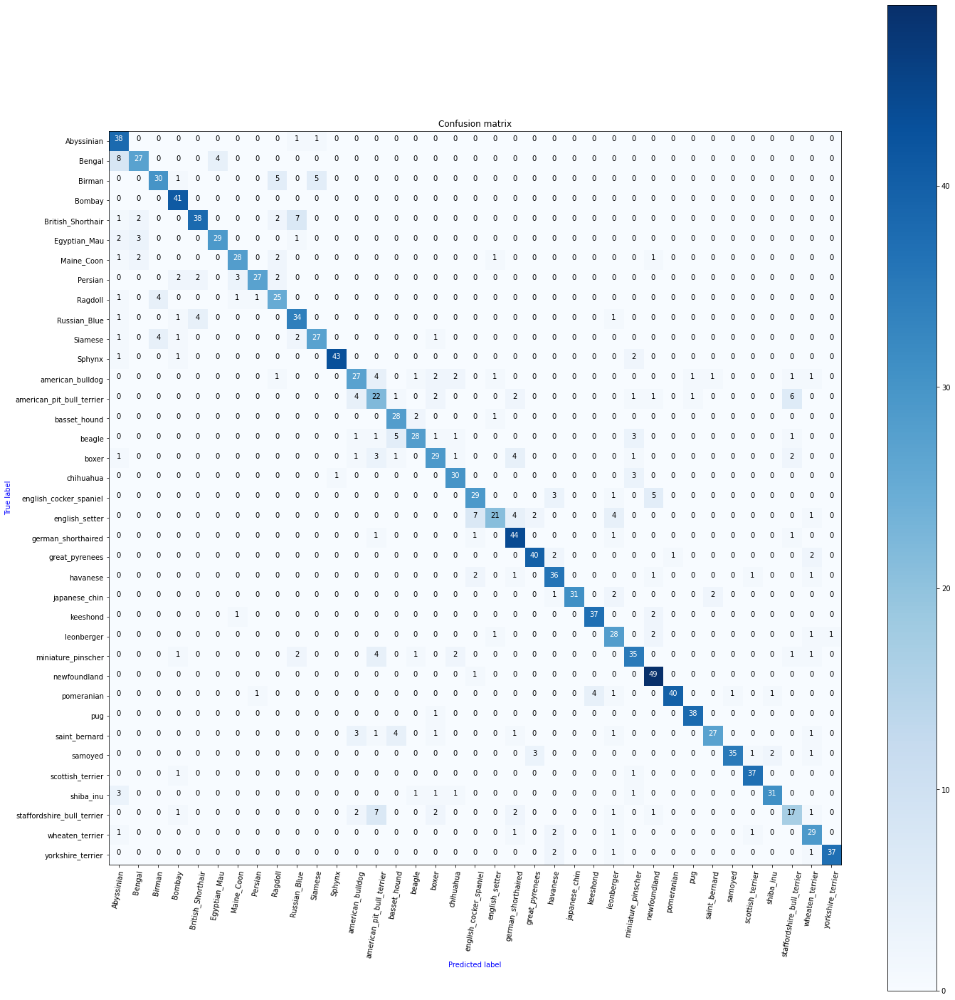

In [22]:
confusion_mtx = confusion_matrix(true_classes, predicted_classes)



# compute the confusion matrix
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(20,20))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=80)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                  horizontalalignment="center",
                  color="white" if cm[i, j] > thresh else "black")
     
    plt.tight_layout()
    plt.ylabel('True label',color='blue')
    plt.xlabel('Predicted label',color='blue')


# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = class_labels, title="Confusion matrix")
